In [1]:
# Importar as bibliotecas necessárias
import os
import time
import numpy as np
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.transforms import functional as F
from PIL import Image
from tqdm import tqdm
from matplotlib import pyplot as plt

# Verificar se CUDA está disponível e definir o dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Usando o dispositivo: {device}")

# Definir as cores para as classes
CLASS_COLORS = { 
    'Doenca': (255, 0, 0), 
    'Saudavel': (0, 255, 0), 
    'Solo': (0, 0, 255),
    'Fundo': (0, 0, 0)
}

Usando o dispositivo: cuda


In [2]:
#definicao dos hiperparametros.
criterion = nn.CrossEntropyLoss()  # Considerando que temos múltiplas classes
# learning_rate = 0.001
num_epochs = 300
patience = 30
batch_size = 1

In [3]:
# Classe do Dataset personalizado
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_path = os.path.join(self.image_dir, img_name)
        
        # Modificar a extensão da máscara para '.png'
        mask_name = os.path.splitext(img_name)[0] + '.png'
        mask_path = os.path.join(self.mask_dir, mask_name)
        
        # Carregar a imagem e a máscara
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")
        
        if self.transform:
            # Aplicar transformações, se houver
            image = self.transform(image)
            mask = self.transform(mask)
            
        # Convertemos as máscaras de imagem em um array de índices de classe
        mask = self.mask_to_class(mask)
        
        return image, mask
    
    def mask_to_class(self, mask):
        # Converte a máscara para um array NumPy e ajusta para escala de 0 a 255
        mask_array = (np.array(mask, dtype=np.float32) * 255).astype(np.uint8)

        # Garantir que esté em [H, W, C]
        if mask_array.shape[0] == 3:
            mask_array = mask_array.transpose(1, 2, 0)

        mask_indices = np.zeros((mask_array.shape[0], mask_array.shape[1]), dtype=np.int64)

        for i, color in enumerate(CLASS_COLORS.values()):
            # Realizar comparação e detecção de igualdade entre pixels
            equal_color = np.all(mask_array == color, axis=-1)
            mask_indices[equal_color] = i

        return torch.tensor(mask_indices, dtype=torch.long)

# Função para criar transformações de dados normais e de aumento de dados
def get_transforms():
    return transforms.Compose([
        transforms.Resize((256, 256)),  # Redimensiona para uma dimensão adequada para o modelo
        transforms.ToTensor(),  # Normaliza para [0, 1]
    ])

# Outras inicializações de datasets e dataloaders
train_dataset = SegmentationDataset(
    image_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/base/Train",
    mask_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/masks/Train",
    transform=get_transforms()
)

val_dataset = SegmentationDataset(
    image_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/base/Val",
    mask_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/masks/Val",
    transform=get_transforms()
)

test_dataset = SegmentationDataset(
    image_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/base/Test",
    mask_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/masks/Test",
    transform=get_transforms()
)

# Criar os DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print("Dados carregados e preparados.")

Dados carregados e preparados.


In [4]:
# Importar a biblioteca segmentation-models-pytorch
!pip install segmentation-models-pytorch --quiet

import segmentation_models_pytorch as smp

# Inicializar as arquiteturas dos modelos com os pesos pretreinados por padrão
unet = smp.Unet(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)
pspnet = smp.PSPNet(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)
linknet = smp.Linknet(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)
deeplabv3 = smp.DeepLabV3(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)

models = {
    'U-Net': unet,
    'PSPNet': pspnet,
    'LinkNet': linknet
}

print("Modelos configurados e prontos para treinamento.")

c:\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Modelos configurados e prontos para treinamento.


In [5]:
import torch
import torchmetrics
import numpy as np
from torchmetrics.classification import MulticlassJaccardIndex, MulticlassF1Score, MulticlassPrecision

def compute_dice_coefficient(preds, targets):
    """
    Calcula o coeficiente de Dice
    """
    intersection = (preds * targets).sum()
    dice = (2. * intersection) / (preds.sum() + targets.sum())
    return dice.item()

def compute_aji(preds, targets):
    """
    Calcula o índice de Jaccard agregado (AJI)
    """
    preds = preds.detach().cpu().numpy().astype(np.bool_)
    targets = targets.detach().cpu().numpy().astype(np.bool_)
    
    # Calcula o Jaccard para cada componente individual nos targets/preds
    intersection = np.logical_and(preds, targets)
    union = np.logical_or(preds, targets)
    jaccard_per_class = intersection.sum() / (union.sum() + 1e-10)  # Evitar divisão por zero
    return jaccard_per_class

# Configurar as métricas, incluindo Dice e AJI personalizados
metrics = {
    'F1': MulticlassF1Score(num_classes=len(CLASS_COLORS)).to(device),
    'Jaccard': MulticlassJaccardIndex(num_classes=len(CLASS_COLORS)).to(device),
    'Precision': MulticlassPrecision(num_classes=len(CLASS_COLORS)).to(device),
    'Dice': compute_dice_coefficient,
    'AJI': compute_aji
}

In [6]:
def get_params_by_kind(model, n_base=7):
    base_vgg_bias = []
    base_vgg_weight = []
    core_weight = []
    core_bias = []

    for name, param in model.named_parameters():
        if 'vgg' in name and ('weight' in name or 'bias' in name):
            vgglayer = int(name.split('.')[-2])

            if vgglayer <= n_base:
                if 'bias' in name:
                    base_vgg_bias.append(param)
                else:
                    base_vgg_weight.append(param)
            else:
                if 'bias' in name:
                    core_bias.append(param)
                else:
                    core_weight.append(param)
        elif ('weight' in name or 'bias' in name):
            if 'bias' in name:
                core_bias.append(param)
            else:
                core_weight.append(param)

    return base_vgg_weight, base_vgg_bias, core_weight, core_bias

In [7]:
import csv
import time
import os
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm

# Configuração do diretório para salvar os resultados
results_dir = "E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/results/data"
os.makedirs(results_dir, exist_ok=True)

def train_model_with_early_stopping(model, train_loader, val_loader, criterion, optimizer, metrics, num_epochs, device, patience, model_name, results_dir):
    since = time.time()
    best_model_wts = model.state_dict()
    best_loss = float('inf')
    patience_counter = 0
    epochs_run = 0  # Variável para contar as épocas realizadas

    # Variáveis para armazenar tempos de execução
    training_time = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)
        
        epochs_run += 1  # Registrar a execução da época

        epoch_start = time.time()  # Marcar o início da época

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                data_loader = train_loader
            else:
                model.eval()
                data_loader = val_loader

            running_loss = 0.0
            running_metrics = {key: 0 for key in metrics.keys()}
            
            for inputs, masks in tqdm(data_loader):
                inputs, masks = inputs.to(device), masks.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, masks)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)

                for metric_name, metric in metrics.items():
                    if metric_name in ['Dice', 'AJI']:
                        value = metric(preds, masks)
                    else:  # Para métricas torchmetrics
                        value = metric(preds, masks).item()
                    running_metrics[metric_name] += value * inputs.size(0)

            epoch_loss = running_loss / len(data_loader.dataset)
            epoch_metrics = {key: value / len(data_loader.dataset) for key, value in running_metrics.items()}

            print(f'{phase} Loss: {epoch_loss:.4f}')
            for metric_name in metrics:
                print(f'{phase} {metric_name}: {epoch_metrics[metric_name]:.4f}')

            if phase == 'val':
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model_wts = model.state_dict()
                    patience_counter = 0
                else:
                    patience_counter += 1

        epoch_end = time.time()  # Marcar o fim da época
        epoch_time = epoch_end - epoch_start
        training_time += epoch_time  # Acumular tempos totais
        print(f'Epoch time: {epoch_time:.2f} seconds')

        print(f'Patience counter: {patience_counter}')

        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val loss: {best_loss:.4f}')
    print(f'Total epochs run: {epochs_run}')

    # Restaurar o melhor modelo
    model.load_state_dict(best_model_wts)

    # Salvar o modelo treinado
    model_path = os.path.join(results_dir, f'{model_name}_best.pth')
    torch.save(model.state_dict(), model_path)

    # Coletar as métricas finais
    final_metrics = epoch_metrics
    final_metrics['best_loss'] = best_loss
    final_metrics['training_time'] = time_elapsed
    final_metrics['epochs_run'] = epochs_run

    # Salvar todas as métricas para CSV
    csv_path = os.path.join(results_dir, 'results.csv')
    write_metrics_to_csv(csv_path, model_name, final_metrics)

    return model

def write_metrics_to_csv(csv_path, model_name, metrics):
    headers = ['nome', 'f1-score', 'indice jaccard', 'precision', 'dice', 'aji', 'best_loss', 'training_time', 'epochs_run']
    row = [
        model_name,
        metrics['F1'],
        metrics['Jaccard'],
        metrics['Precision'],
        metrics['Dice'],
        metrics['AJI'],
        metrics['best_loss'],
        metrics['training_time'],
        metrics['epochs_run']
    ]

    file_exists = os.path.isfile(csv_path)

    with open(csv_path, mode='a', newline='') as f:
        writer = csv.writer(f)
        if not file_exists:
            writer.writerow(headers)  # Escrever cabeçalhos se o arquivo não existe
        writer.writerow(row)  # Salvar linha de métricas

# Executar o Treinamento dos Modelos
for model_name, model in models.items():
    print("*********************************************************************")
    print(f"Treinando {model_name} com early stopping.")
    
    # Defina os grupos de parâmetros para o modelo atual
    base_vgg_weight, base_vgg_bias, core_weight, core_bias = get_params_by_kind(model, 7)

    # Configurar o otimizador com diferentes learning rates para cada grupo de parâmetros
    optimizer = torch.optim.SGD([
        {'params': base_vgg_bias, 'lr': 0.00001},
        {'params': base_vgg_weight, 'lr': 0.00001},
        {'params': core_bias, 'lr': 0.02},
        {'params': core_weight, 'lr': 0.02, 'weight_decay': 0.0005}
    ], momentum=0.9)

    # Treinando o modelo
    trained_model = train_model_with_early_stopping(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        criterion=criterion,
        optimizer=optimizer,
        metrics=metrics,
        num_epochs=num_epochs,
        device=device,
        patience=patience,
        model_name=model_name,
        results_dir=results_dir
    )
    print(f'{model_name} treinado e salvo com sucesso.')

print("Treinamento completo de todos os modelos com early stopping.")

*********************************************************************
Treinando U-Net com early stopping.
Epoch 1/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.93it/s]


train Loss: 1.2142
train F1: 0.3488
train Jaccard: 0.2523
train Precision: 0.4232
train Dice: 1.9096
train AJI: 0.7204


100%|██████████| 40/40 [00:08<00:00,  4.61it/s]


val Loss: 1.2769
val F1: 0.3764
val Jaccard: 0.2781
val Precision: 0.4660
val Dice: 1.7411
val AJI: 0.7523
Epoch time: 29.05 seconds
Patience counter: 0
Epoch 2/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.17it/s]


train Loss: 0.8924
train F1: 0.4821
train Jaccard: 0.3805
train Precision: 0.5176
train Dice: 1.9781
train AJI: 0.7703


100%|██████████| 40/40 [00:08<00:00,  4.64it/s]


val Loss: 1.1756
val F1: 0.3493
val Jaccard: 0.2563
val Precision: 0.4796
val Dice: 1.8140
val AJI: 0.8000
Epoch time: 27.80 seconds
Patience counter: 0
Epoch 3/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.10it/s]


train Loss: 0.7620
train F1: 0.5341
train Jaccard: 0.4285
train Precision: 0.5799
train Dice: 2.0012
train AJI: 0.7952


100%|██████████| 40/40 [00:08<00:00,  4.60it/s]


val Loss: 1.3623
val F1: 0.3729
val Jaccard: 0.2788
val Precision: 0.4308
val Dice: 1.8408
val AJI: 0.7959
Epoch time: 28.22 seconds
Patience counter: 1
Epoch 4/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.07it/s]


train Loss: 0.7288
train F1: 0.5522
train Jaccard: 0.4457
train Precision: 0.5963
train Dice: 1.9945
train AJI: 0.7797


100%|██████████| 40/40 [00:09<00:00,  4.43it/s]


val Loss: 2.3031
val F1: 0.2869
val Jaccard: 0.1933
val Precision: 0.4250
val Dice: 1.5373
val AJI: 0.7116
Epoch time: 28.72 seconds
Patience counter: 2
Epoch 5/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.07it/s]


train Loss: 0.7427
train F1: 0.5328
train Jaccard: 0.4291
train Precision: 0.5728
train Dice: 1.9803
train AJI: 0.7980


100%|██████████| 40/40 [00:08<00:00,  4.45it/s]


val Loss: 1.0513
val F1: 0.4141
val Jaccard: 0.3040
val Precision: 0.4988
val Dice: 1.7613
val AJI: 0.7724
Epoch time: 28.66 seconds
Patience counter: 0
Epoch 6/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.96it/s]


train Loss: 0.6558
train F1: 0.5839
train Jaccard: 0.4741
train Precision: 0.6186
train Dice: 2.0172
train AJI: 0.7976


100%|██████████| 40/40 [00:09<00:00,  4.41it/s]


val Loss: 0.9505
val F1: 0.4243
val Jaccard: 0.3058
val Precision: 0.5202
val Dice: 1.8307
val AJI: 0.7608
Epoch time: 29.29 seconds
Patience counter: 0
Epoch 7/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.99it/s]


train Loss: 0.6023
train F1: 0.6097
train Jaccard: 0.4993
train Precision: 0.6420
train Dice: 2.0272
train AJI: 0.8072


100%|██████████| 40/40 [00:08<00:00,  4.62it/s]


val Loss: 1.5463
val F1: 0.3788
val Jaccard: 0.2915
val Precision: 0.4822
val Dice: 1.8156
val AJI: 0.8064
Epoch time: 28.70 seconds
Patience counter: 1
Epoch 8/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.15it/s]


train Loss: 0.5433
train F1: 0.6488
train Jaccard: 0.5377
train Precision: 0.6793
train Dice: 2.0490
train AJI: 0.8250


100%|██████████| 40/40 [00:08<00:00,  4.57it/s]


val Loss: 1.2096
val F1: 0.4219
val Jaccard: 0.3175
val Precision: 0.5139
val Dice: 1.7818
val AJI: 0.7759
Epoch time: 28.02 seconds
Patience counter: 2
Epoch 9/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.87it/s]


train Loss: 0.4950
train F1: 0.6805
train Jaccard: 0.5704
train Precision: 0.7120
train Dice: 2.0683
train AJI: 0.8353


100%|██████████| 40/40 [00:09<00:00,  4.40it/s]


val Loss: 1.4848
val F1: 0.3868
val Jaccard: 0.2865
val Precision: 0.4921
val Dice: 1.6900
val AJI: 0.6252
Epoch time: 29.80 seconds
Patience counter: 3
Epoch 10/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.99it/s]


train Loss: 0.4970
train F1: 0.6810
train Jaccard: 0.5707
train Precision: 0.7105
train Dice: 2.0793
train AJI: 0.8395


100%|██████████| 40/40 [00:08<00:00,  4.50it/s]


val Loss: 1.2665
val F1: 0.3851
val Jaccard: 0.2839
val Precision: 0.4969
val Dice: 1.8491
val AJI: 0.7969
Epoch time: 28.94 seconds
Patience counter: 4
Epoch 11/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.98it/s]


train Loss: 0.4422
train F1: 0.6968
train Jaccard: 0.5926
train Precision: 0.7264
train Dice: 2.0802
train AJI: 0.8446


100%|██████████| 40/40 [00:08<00:00,  4.47it/s]


val Loss: 1.2974
val F1: 0.4076
val Jaccard: 0.3089
val Precision: 0.5056
val Dice: 1.7600
val AJI: 0.7140
Epoch time: 29.05 seconds
Patience counter: 5
Epoch 12/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.93it/s]


train Loss: 0.4238
train F1: 0.7124
train Jaccard: 0.6075
train Precision: 0.7390
train Dice: 2.0914
train AJI: 0.8512


100%|██████████| 40/40 [00:08<00:00,  4.57it/s]


val Loss: 1.0840
val F1: 0.5013
val Jaccard: 0.3909
val Precision: 0.5776
val Dice: 1.8397
val AJI: 0.7613
Epoch time: 29.13 seconds
Patience counter: 6
Epoch 13/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.10it/s]


train Loss: 0.3896
train F1: 0.7297
train Jaccard: 0.6253
train Precision: 0.7538
train Dice: 2.0943
train AJI: 0.8628


100%|██████████| 40/40 [00:08<00:00,  4.49it/s]


val Loss: 1.3963
val F1: 0.4405
val Jaccard: 0.3321
val Precision: 0.5287
val Dice: 1.7517
val AJI: 0.7265
Epoch time: 28.42 seconds
Patience counter: 7
Epoch 14/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.90it/s]


train Loss: 0.3834
train F1: 0.7346
train Jaccard: 0.6323
train Precision: 0.7627
train Dice: 2.0980
train AJI: 0.8575


100%|██████████| 40/40 [00:08<00:00,  4.52it/s]


val Loss: 1.2441
val F1: 0.4543
val Jaccard: 0.3477
val Precision: 0.5248
val Dice: 1.7974
val AJI: 0.7944
Epoch time: 29.35 seconds
Patience counter: 8
Epoch 15/300
----------


100%|██████████| 80/80 [00:22<00:00,  3.62it/s]


train Loss: 0.3313
train F1: 0.7666
train Jaccard: 0.6695
train Precision: 0.7832
train Dice: 2.1200
train AJI: 0.8743


100%|██████████| 40/40 [00:10<00:00,  3.71it/s]


val Loss: 1.1849
val F1: 0.4589
val Jaccard: 0.3487
val Precision: 0.5411
val Dice: 1.8318
val AJI: 0.7773
Epoch time: 32.90 seconds
Patience counter: 9
Epoch 16/300
----------


100%|██████████| 80/80 [00:22<00:00,  3.50it/s]


train Loss: 0.3517
train F1: 0.7513
train Jaccard: 0.6521
train Precision: 0.7749
train Dice: 2.1131
train AJI: 0.8646


100%|██████████| 40/40 [00:09<00:00,  4.24it/s]


val Loss: 1.6523
val F1: 0.4358
val Jaccard: 0.3299
val Precision: 0.5510
val Dice: 1.6490
val AJI: 0.6733
Epoch time: 32.27 seconds
Patience counter: 10
Epoch 17/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.01it/s]


train Loss: 0.3013
train F1: 0.7694
train Jaccard: 0.6767
train Precision: 0.7860
train Dice: 2.1344
train AJI: 0.8790


100%|██████████| 40/40 [00:08<00:00,  4.53it/s]


val Loss: 1.0432
val F1: 0.4873
val Jaccard: 0.3750
val Precision: 0.5470
val Dice: 1.8340
val AJI: 0.8071
Epoch time: 28.78 seconds
Patience counter: 11
Epoch 18/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.03it/s]


train Loss: 0.2531
train F1: 0.8056
train Jaccard: 0.7194
train Precision: 0.8197
train Dice: 2.1507
train AJI: 0.8940


100%|██████████| 40/40 [00:08<00:00,  4.54it/s]


val Loss: 1.1902
val F1: 0.4795
val Jaccard: 0.3671
val Precision: 0.5620
val Dice: 1.7581
val AJI: 0.7832
Epoch time: 28.66 seconds
Patience counter: 12
Epoch 19/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.06it/s]


train Loss: 0.2416
train F1: 0.8181
train Jaccard: 0.7334
train Precision: 0.8325
train Dice: 2.1584
train AJI: 0.8987


100%|██████████| 40/40 [00:08<00:00,  4.53it/s]


val Loss: 1.4584
val F1: 0.4760
val Jaccard: 0.3664
val Precision: 0.5432
val Dice: 1.7630
val AJI: 0.7856
Epoch time: 28.56 seconds
Patience counter: 13
Epoch 20/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.07it/s]


train Loss: 0.2301
train F1: 0.8286
train Jaccard: 0.7449
train Precision: 0.8416
train Dice: 2.1647
train AJI: 0.9017


100%|██████████| 40/40 [00:09<00:00,  4.34it/s]


val Loss: 1.3160
val F1: 0.5068
val Jaccard: 0.3907
val Precision: 0.5810
val Dice: 1.8253
val AJI: 0.7635
Epoch time: 28.86 seconds
Patience counter: 14
Epoch 21/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.04it/s]


train Loss: 0.2513
train F1: 0.8035
train Jaccard: 0.7187
train Precision: 0.8241
train Dice: 2.1609
train AJI: 0.8934


100%|██████████| 40/40 [00:08<00:00,  4.53it/s]


val Loss: 1.7177
val F1: 0.4533
val Jaccard: 0.3480
val Precision: 0.5079
val Dice: 1.8104
val AJI: 0.7787
Epoch time: 28.64 seconds
Patience counter: 15
Epoch 22/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.05it/s]


train Loss: 0.2221
train F1: 0.8292
train Jaccard: 0.7461
train Precision: 0.8413
train Dice: 2.1674
train AJI: 0.9011


100%|██████████| 40/40 [00:08<00:00,  4.46it/s]


val Loss: 1.3355
val F1: 0.4610
val Jaccard: 0.3518
val Precision: 0.5334
val Dice: 1.7858
val AJI: 0.7460
Epoch time: 28.74 seconds
Patience counter: 16
Epoch 23/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.01it/s]


train Loss: 0.2171
train F1: 0.8233
train Jaccard: 0.7438
train Precision: 0.8350
train Dice: 2.1722
train AJI: 0.9046


100%|██████████| 40/40 [00:08<00:00,  4.53it/s]


val Loss: 1.8197
val F1: 0.3773
val Jaccard: 0.2889
val Precision: 0.4832
val Dice: 1.6489
val AJI: 0.6097
Epoch time: 28.77 seconds
Patience counter: 17
Epoch 24/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.06it/s]


train Loss: 0.1975
train F1: 0.8450
train Jaccard: 0.7668
train Precision: 0.8588
train Dice: 2.1797
train AJI: 0.9093


100%|██████████| 40/40 [00:09<00:00,  4.44it/s]


val Loss: 1.7090
val F1: 0.4732
val Jaccard: 0.3610
val Precision: 0.5480
val Dice: 1.7708
val AJI: 0.7467
Epoch time: 28.70 seconds
Patience counter: 18
Epoch 25/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.02it/s]


train Loss: 0.1789
train F1: 0.8669
train Jaccard: 0.7914
train Precision: 0.8829
train Dice: 2.1887
train AJI: 0.9147


100%|██████████| 40/40 [00:09<00:00,  4.39it/s]


val Loss: 1.6630
val F1: 0.4782
val Jaccard: 0.3673
val Precision: 0.5275
val Dice: 1.8241
val AJI: 0.7943
Epoch time: 29.02 seconds
Patience counter: 19
Epoch 26/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.12it/s]


train Loss: 0.1719
train F1: 0.8637
train Jaccard: 0.7901
train Precision: 0.8755
train Dice: 2.1925
train AJI: 0.9161


100%|██████████| 40/40 [00:09<00:00,  4.41it/s]


val Loss: 1.8257
val F1: 0.4692
val Jaccard: 0.3592
val Precision: 0.5290
val Dice: 1.7775
val AJI: 0.7523
Epoch time: 28.50 seconds
Patience counter: 20
Epoch 27/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.99it/s]


train Loss: 0.1712
train F1: 0.8647
train Jaccard: 0.7907
train Precision: 0.8761
train Dice: 2.1928
train AJI: 0.9160


100%|██████████| 40/40 [00:09<00:00,  4.32it/s]


val Loss: 2.2369
val F1: 0.4673
val Jaccard: 0.3594
val Precision: 0.5135
val Dice: 1.8044
val AJI: 0.7727
Epoch time: 29.30 seconds
Patience counter: 21
Epoch 28/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.06it/s]


train Loss: 0.1625
train F1: 0.8750
train Jaccard: 0.8039
train Precision: 0.8847
train Dice: 2.1980
train AJI: 0.9200


100%|██████████| 40/40 [00:08<00:00,  4.51it/s]


val Loss: 1.7506
val F1: 0.4832
val Jaccard: 0.3723
val Precision: 0.5277
val Dice: 1.8033
val AJI: 0.7822
Epoch time: 28.57 seconds
Patience counter: 22
Epoch 29/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.14it/s]


train Loss: 0.1522
train F1: 0.8876
train Jaccard: 0.8183
train Precision: 0.8967
train Dice: 2.2028
train AJI: 0.9237


100%|██████████| 40/40 [00:09<00:00,  4.43it/s]


val Loss: 2.1793
val F1: 0.4816
val Jaccard: 0.3719
val Precision: 0.5210
val Dice: 1.7712
val AJI: 0.7793
Epoch time: 28.34 seconds
Patience counter: 23
Epoch 30/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.15it/s]


train Loss: 0.1429
train F1: 0.8926
train Jaccard: 0.8258
train Precision: 0.9027
train Dice: 2.2108
train AJI: 0.9269


100%|██████████| 40/40 [00:08<00:00,  4.50it/s]


val Loss: 1.7175
val F1: 0.4359
val Jaccard: 0.3335
val Precision: 0.5349
val Dice: 1.7003
val AJI: 0.6847
Epoch time: 28.19 seconds
Patience counter: 24
Epoch 31/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.10it/s]


train Loss: 0.1408
train F1: 0.9005
train Jaccard: 0.8338
train Precision: 0.9084
train Dice: 2.2120
train AJI: 0.9281


100%|██████████| 40/40 [00:09<00:00,  4.44it/s]


val Loss: 1.7186
val F1: 0.4952
val Jaccard: 0.3804
val Precision: 0.5587
val Dice: 1.8288
val AJI: 0.7817
Epoch time: 28.51 seconds
Patience counter: 25
Epoch 32/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.12it/s]


train Loss: 0.1365
train F1: 0.8900
train Jaccard: 0.8246
train Precision: 0.9009
train Dice: 2.2137
train AJI: 0.9295


100%|██████████| 40/40 [00:08<00:00,  4.50it/s]


val Loss: 2.0372
val F1: 0.4820
val Jaccard: 0.3705
val Precision: 0.5359
val Dice: 1.7579
val AJI: 0.7716
Epoch time: 28.31 seconds
Patience counter: 26
Epoch 33/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.13it/s]


train Loss: 0.1361
train F1: 0.9035
train Jaccard: 0.8378
train Precision: 0.9107
train Dice: 2.2156
train AJI: 0.9299


100%|██████████| 40/40 [00:08<00:00,  4.57it/s]


val Loss: 1.6920
val F1: 0.4863
val Jaccard: 0.3740
val Precision: 0.5551
val Dice: 1.7906
val AJI: 0.7827
Epoch time: 28.11 seconds
Patience counter: 27
Epoch 34/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.11it/s]


train Loss: 0.1337
train F1: 0.8919
train Jaccard: 0.8282
train Precision: 0.8999
train Dice: 2.2184
train AJI: 0.9318


100%|██████████| 40/40 [00:08<00:00,  4.53it/s]


val Loss: 1.7567
val F1: 0.4785
val Jaccard: 0.3675
val Precision: 0.5330
val Dice: 1.7781
val AJI: 0.7771
Epoch time: 28.31 seconds
Patience counter: 28
Epoch 35/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.10it/s]


train Loss: 0.1274
train F1: 0.9075
train Jaccard: 0.8451
train Precision: 0.9141
train Dice: 2.2219
train AJI: 0.9339


100%|██████████| 40/40 [00:08<00:00,  4.59it/s]


val Loss: 1.5500
val F1: 0.5033
val Jaccard: 0.3856
val Precision: 0.5705
val Dice: 1.8195
val AJI: 0.7906
Epoch time: 28.26 seconds
Patience counter: 29
Epoch 36/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.13it/s]


train Loss: 0.1309
train F1: 0.9066
train Jaccard: 0.8432
train Precision: 0.9136
train Dice: 2.2210
train AJI: 0.9329


100%|██████████| 40/40 [00:08<00:00,  4.52it/s]


val Loss: 1.9569
val F1: 0.4982
val Jaccard: 0.3820
val Precision: 0.5643
val Dice: 1.7811
val AJI: 0.7879
Epoch time: 28.22 seconds
Patience counter: 30
Early stopping triggered.
Training complete in 17m 20s
Best val loss: 0.9505
Total epochs run: 36
U-Net treinado e salvo com sucesso.
*********************************************************************
Treinando PSPNet com early stopping.
Epoch 1/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.45it/s]


train Loss: 5.0287
train F1: 0.3097
train Jaccard: 0.2171
train Precision: 0.3726
train Dice: 1.8011
train AJI: 0.6981


100%|██████████| 40/40 [00:08<00:00,  4.71it/s]


val Loss: 2.3374
val F1: 0.3646
val Jaccard: 0.2738
val Precision: 0.4376
val Dice: 1.8781
val AJI: 0.8059
Epoch time: 26.46 seconds
Patience counter: 0
Epoch 2/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.40it/s]


train Loss: 1.6014
train F1: 0.4064
train Jaccard: 0.2992
train Precision: 0.4927
train Dice: 1.9226
train AJI: 0.7427


100%|██████████| 40/40 [00:08<00:00,  4.60it/s]


val Loss: 1.3692
val F1: 0.3221
val Jaccard: 0.2350
val Precision: 0.4288
val Dice: 1.8748
val AJI: 0.7591
Epoch time: 26.91 seconds
Patience counter: 0
Epoch 3/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.44it/s]


train Loss: 1.1197
train F1: 0.4957
train Jaccard: 0.3818
train Precision: 0.5426
train Dice: 1.9733
train AJI: 0.7799


100%|██████████| 40/40 [00:08<00:00,  4.69it/s]


val Loss: 9.1148
val F1: 0.3577
val Jaccard: 0.2615
val Precision: 0.4208
val Dice: 1.6980
val AJI: 0.6716
Epoch time: 26.54 seconds
Patience counter: 1
Epoch 4/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.48it/s]


train Loss: 1.7150
train F1: 0.3485
train Jaccard: 0.2500
train Precision: 0.4171
train Dice: 1.8751
train AJI: 0.7503


100%|██████████| 40/40 [00:08<00:00,  4.68it/s]


val Loss: 2.0546
val F1: 0.2681
val Jaccard: 0.1915
val Precision: 0.3492
val Dice: 1.5518
val AJI: 0.5929
Epoch time: 26.41 seconds
Patience counter: 2
Epoch 5/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.41it/s]


train Loss: 1.1913
train F1: 0.4642
train Jaccard: 0.3530
train Precision: 0.5058
train Dice: 1.9539
train AJI: 0.7637


100%|██████████| 40/40 [00:08<00:00,  4.59it/s]


val Loss: 11.8479
val F1: 0.3000
val Jaccard: 0.2047
val Precision: 0.3903
val Dice: 1.8388
val AJI: 0.7744
Epoch time: 26.87 seconds
Patience counter: 3
Epoch 6/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.44it/s]


train Loss: 1.0445
train F1: 0.4974
train Jaccard: 0.3854
train Precision: 0.5408
train Dice: 1.9912
train AJI: 0.7847


100%|██████████| 40/40 [00:09<00:00,  4.16it/s]


val Loss: 2.5857
val F1: 0.2946
val Jaccard: 0.2026
val Precision: 0.4408
val Dice: 1.7144
val AJI: 0.7275
Epoch time: 27.66 seconds
Patience counter: 4
Epoch 7/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.45it/s]


train Loss: 0.8988
train F1: 0.5371
train Jaccard: 0.4237
train Precision: 0.5765
train Dice: 1.9954
train AJI: 0.7877


100%|██████████| 40/40 [00:08<00:00,  4.71it/s]


val Loss: 3.9564
val F1: 0.3392
val Jaccard: 0.2408
val Precision: 0.4063
val Dice: 1.8125
val AJI: 0.7033
Epoch time: 26.49 seconds
Patience counter: 5
Epoch 8/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.51it/s]


train Loss: 0.8359
train F1: 0.5623
train Jaccard: 0.4468
train Precision: 0.5992
train Dice: 2.0174
train AJI: 0.7962


100%|██████████| 40/40 [00:08<00:00,  4.70it/s]


val Loss: 3.2588
val F1: 0.3837
val Jaccard: 0.2910
val Precision: 0.4751
val Dice: 1.7563
val AJI: 0.7433
Epoch time: 26.25 seconds
Patience counter: 6
Epoch 9/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.48it/s]


train Loss: 0.8090
train F1: 0.5778
train Jaccard: 0.4596
train Precision: 0.6155
train Dice: 2.0228
train AJI: 0.8039


100%|██████████| 40/40 [00:08<00:00,  4.60it/s]


val Loss: 3.2234
val F1: 0.3105
val Jaccard: 0.2270
val Precision: 0.4518
val Dice: 1.6796
val AJI: 0.7201
Epoch time: 26.56 seconds
Patience counter: 7
Epoch 10/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.53it/s]


train Loss: 0.7291
train F1: 0.5981
train Jaccard: 0.4809
train Precision: 0.6406
train Dice: 2.0289
train AJI: 0.8089


100%|██████████| 40/40 [00:08<00:00,  4.76it/s]


val Loss: 3.0491
val F1: 0.3280
val Jaccard: 0.2389
val Precision: 0.4635
val Dice: 1.5688
val AJI: 0.5931
Epoch time: 26.08 seconds
Patience counter: 8
Epoch 11/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.44it/s]


train Loss: 0.6795
train F1: 0.6270
train Jaccard: 0.5089
train Precision: 0.6641
train Dice: 2.0364
train AJI: 0.8171


100%|██████████| 40/40 [00:08<00:00,  4.67it/s]


val Loss: 3.1254
val F1: 0.3356
val Jaccard: 0.2484
val Precision: 0.4350
val Dice: 1.7015
val AJI: 0.7385
Epoch time: 26.60 seconds
Patience counter: 9
Epoch 12/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.45it/s]


train Loss: 0.6555
train F1: 0.6319
train Jaccard: 0.5148
train Precision: 0.6671
train Dice: 2.0411
train AJI: 0.8217


100%|██████████| 40/40 [00:08<00:00,  4.67it/s]


val Loss: 9.3137
val F1: 0.3145
val Jaccard: 0.2258
val Precision: 0.4233
val Dice: 1.7543
val AJI: 0.7582
Epoch time: 26.54 seconds
Patience counter: 10
Epoch 13/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.42it/s]


train Loss: 0.6377
train F1: 0.6393
train Jaccard: 0.5211
train Precision: 0.6681
train Dice: 2.0424
train AJI: 0.8271


100%|██████████| 40/40 [00:08<00:00,  4.72it/s]


val Loss: 4.3098
val F1: 0.3249
val Jaccard: 0.2417
val Precision: 0.4216
val Dice: 1.7242
val AJI: 0.7576
Epoch time: 26.60 seconds
Patience counter: 11
Epoch 14/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.20it/s]


train Loss: 0.5902
train F1: 0.6611
train Jaccard: 0.5439
train Precision: 0.6900
train Dice: 2.0557
train AJI: 0.8342


100%|██████████| 40/40 [00:08<00:00,  4.82it/s]


val Loss: 6.4179
val F1: 0.3202
val Jaccard: 0.2343
val Precision: 0.4148
val Dice: 1.7558
val AJI: 0.7591
Epoch time: 27.35 seconds
Patience counter: 12
Epoch 15/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.30it/s]


train Loss: 0.5434
train F1: 0.6816
train Jaccard: 0.5649
train Precision: 0.7087
train Dice: 2.0644
train AJI: 0.8401


100%|██████████| 40/40 [00:09<00:00,  4.38it/s]


val Loss: 13.9972
val F1: 0.3253
val Jaccard: 0.2404
val Precision: 0.4371
val Dice: 1.9022
val AJI: 0.8010
Epoch time: 27.76 seconds
Patience counter: 13
Epoch 16/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.45it/s]


train Loss: 0.5184
train F1: 0.7010
train Jaccard: 0.5845
train Precision: 0.7305
train Dice: 2.0777
train AJI: 0.8467


100%|██████████| 40/40 [00:08<00:00,  4.71it/s]


val Loss: 2.3895
val F1: 0.3876
val Jaccard: 0.2878
val Precision: 0.4773
val Dice: 1.6991
val AJI: 0.6325
Epoch time: 26.49 seconds
Patience counter: 14
Epoch 17/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.56it/s]


train Loss: 0.5264
train F1: 0.7054
train Jaccard: 0.5895
train Precision: 0.7331
train Dice: 2.0858
train AJI: 0.8527


100%|██████████| 40/40 [00:08<00:00,  4.78it/s]


val Loss: 3.9588
val F1: 0.3651
val Jaccard: 0.2743
val Precision: 0.4535
val Dice: 1.8075
val AJI: 0.7745
Epoch time: 25.91 seconds
Patience counter: 15
Epoch 18/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.50it/s]


train Loss: 0.5093
train F1: 0.7007
train Jaccard: 0.5838
train Precision: 0.7249
train Dice: 2.0792
train AJI: 0.8477


100%|██████████| 40/40 [00:08<00:00,  4.85it/s]


val Loss: 4.6024
val F1: 0.3102
val Jaccard: 0.2176
val Precision: 0.4244
val Dice: 1.7663
val AJI: 0.6819
Epoch time: 26.02 seconds
Patience counter: 16
Epoch 19/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.66it/s]


train Loss: 0.4732
train F1: 0.7225
train Jaccard: 0.6074
train Precision: 0.7535
train Dice: 2.0862
train AJI: 0.8585


100%|██████████| 40/40 [00:08<00:00,  4.84it/s]


val Loss: 8.0995
val F1: 0.3384
val Jaccard: 0.2424
val Precision: 0.4083
val Dice: 1.8313
val AJI: 0.7446
Epoch time: 25.45 seconds
Patience counter: 17
Epoch 20/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.57it/s]


train Loss: 0.4670
train F1: 0.7246
train Jaccard: 0.6108
train Precision: 0.7497
train Dice: 2.0911
train AJI: 0.8524


100%|██████████| 40/40 [00:08<00:00,  4.82it/s]


val Loss: 2.7615
val F1: 0.4070
val Jaccard: 0.3091
val Precision: 0.4999
val Dice: 1.8443
val AJI: 0.7332
Epoch time: 25.82 seconds
Patience counter: 18
Epoch 21/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.63it/s]


train Loss: 0.4371
train F1: 0.7412
train Jaccard: 0.6304
train Precision: 0.7647
train Dice: 2.0992
train AJI: 0.8627


100%|██████████| 40/40 [00:08<00:00,  4.84it/s]


val Loss: 4.9344
val F1: 0.3430
val Jaccard: 0.2539
val Precision: 0.4488
val Dice: 1.5806
val AJI: 0.5920
Epoch time: 25.56 seconds
Patience counter: 19
Epoch 22/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.59it/s]


train Loss: 0.4051
train F1: 0.7569
train Jaccard: 0.6488
train Precision: 0.7747
train Dice: 2.1093
train AJI: 0.8697


100%|██████████| 40/40 [00:08<00:00,  4.91it/s]


val Loss: 4.9837
val F1: 0.3870
val Jaccard: 0.2909
val Precision: 0.4536
val Dice: 1.8459
val AJI: 0.7353
Epoch time: 25.58 seconds
Patience counter: 20
Epoch 23/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.61it/s]


train Loss: 0.3918
train F1: 0.7718
train Jaccard: 0.6640
train Precision: 0.7866
train Dice: 2.1171
train AJI: 0.8754


100%|██████████| 40/40 [00:08<00:00,  4.92it/s]


val Loss: 4.2256
val F1: 0.3604
val Jaccard: 0.2727
val Precision: 0.4651
val Dice: 1.7587
val AJI: 0.7073
Epoch time: 25.49 seconds
Patience counter: 21
Epoch 24/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.62it/s]


train Loss: 0.3982
train F1: 0.7534
train Jaccard: 0.6458
train Precision: 0.7738
train Dice: 2.1046
train AJI: 0.8737


100%|██████████| 40/40 [00:08<00:00,  4.84it/s]


val Loss: 6.0641
val F1: 0.3556
val Jaccard: 0.2624
val Precision: 0.4442
val Dice: 1.7717
val AJI: 0.6986
Epoch time: 25.59 seconds
Patience counter: 22
Epoch 25/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.58it/s]


train Loss: 0.3932
train F1: 0.7618
train Jaccard: 0.6531
train Precision: 0.7775
train Dice: 2.1115
train AJI: 0.8698


100%|██████████| 40/40 [00:08<00:00,  4.78it/s]


val Loss: 7.2034
val F1: 0.3624
val Jaccard: 0.2661
val Precision: 0.4579
val Dice: 1.8262
val AJI: 0.7189
Epoch time: 25.85 seconds
Patience counter: 23
Epoch 26/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.56it/s]


train Loss: 0.3688
train F1: 0.7765
train Jaccard: 0.6719
train Precision: 0.7954
train Dice: 2.1228
train AJI: 0.8792


100%|██████████| 40/40 [00:08<00:00,  4.94it/s]


val Loss: 5.7127
val F1: 0.3930
val Jaccard: 0.2964
val Precision: 0.4785
val Dice: 1.9016
val AJI: 0.7801
Epoch time: 25.65 seconds
Patience counter: 24
Epoch 27/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.56it/s]


train Loss: 0.3639
train F1: 0.7833
train Jaccard: 0.6783
train Precision: 0.8006
train Dice: 2.1235
train AJI: 0.8776


100%|██████████| 40/40 [00:08<00:00,  4.83it/s]


val Loss: 2.9952
val F1: 0.3907
val Jaccard: 0.2964
val Precision: 0.4800
val Dice: 1.8712
val AJI: 0.7743
Epoch time: 25.83 seconds
Patience counter: 25
Epoch 28/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.63it/s]


train Loss: 0.3421
train F1: 0.7865
train Jaccard: 0.6858
train Precision: 0.8090
train Dice: 2.1318
train AJI: 0.8843


100%|██████████| 40/40 [00:08<00:00,  4.92it/s]


val Loss: 2.9090
val F1: 0.3779
val Jaccard: 0.2876
val Precision: 0.5021
val Dice: 1.6505
val AJI: 0.6432
Epoch time: 25.43 seconds
Patience counter: 26
Epoch 29/300
----------


100%|██████████| 80/80 [00:17<00:00,  4.60it/s]


train Loss: 0.3301
train F1: 0.7953
train Jaccard: 0.6950
train Precision: 0.8069
train Dice: 2.1354
train AJI: 0.8882


100%|██████████| 40/40 [00:08<00:00,  4.58it/s]


val Loss: 2.7773
val F1: 0.4075
val Jaccard: 0.3078
val Precision: 0.4847
val Dice: 1.8717
val AJI: 0.7861
Epoch time: 26.15 seconds
Patience counter: 27
Epoch 30/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.20it/s]


train Loss: 0.3201
train F1: 0.8035
train Jaccard: 0.7049
train Precision: 0.8214
train Dice: 2.1351
train AJI: 0.8897


100%|██████████| 40/40 [00:08<00:00,  4.50it/s]


val Loss: 6.8597
val F1: 0.3511
val Jaccard: 0.2494
val Precision: 0.4410
val Dice: 1.7978
val AJI: 0.7257
Epoch time: 27.93 seconds
Patience counter: 28
Epoch 31/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.38it/s]


train Loss: 0.3068
train F1: 0.7975
train Jaccard: 0.6996
train Precision: 0.8156
train Dice: 2.1420
train AJI: 0.8918


100%|██████████| 40/40 [00:08<00:00,  4.54it/s]


val Loss: 3.4447
val F1: 0.3559
val Jaccard: 0.2575
val Precision: 0.4566
val Dice: 1.8320
val AJI: 0.7843
Epoch time: 27.07 seconds
Patience counter: 29
Epoch 32/300
----------


100%|██████████| 80/80 [00:18<00:00,  4.41it/s]


train Loss: 0.3245
train F1: 0.7838
train Jaccard: 0.6860
train Precision: 0.8019
train Dice: 2.1352
train AJI: 0.8878


100%|██████████| 40/40 [00:08<00:00,  4.81it/s]


val Loss: 5.2353
val F1: 0.3218
val Jaccard: 0.2275
val Precision: 0.4127
val Dice: 1.6839
val AJI: 0.7742
Epoch time: 26.45 seconds
Patience counter: 30
Early stopping triggered.
Training complete in 14m 3s
Best val loss: 1.3692
Total epochs run: 32
PSPNet treinado e salvo com sucesso.
*********************************************************************
Treinando LinkNet com early stopping.
Epoch 1/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.86it/s]


train Loss: 1.1748
train F1: 0.3505
train Jaccard: 0.2554
train Precision: 0.4117
train Dice: 1.8499
train AJI: 0.7204


100%|██████████| 40/40 [00:08<00:00,  4.55it/s]


val Loss: 1.0640
val F1: 0.3403
val Jaccard: 0.2565
val Precision: 0.4287
val Dice: 1.6179
val AJI: 0.5779
Epoch time: 29.54 seconds
Patience counter: 0
Epoch 2/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.88it/s]


train Loss: 0.9161
train F1: 0.4822
train Jaccard: 0.3766
train Precision: 0.5195
train Dice: 1.9664
train AJI: 0.7610


100%|██████████| 40/40 [00:09<00:00,  4.28it/s]


val Loss: 0.9523
val F1: 0.3689
val Jaccard: 0.2707
val Precision: 0.4556
val Dice: 1.7605
val AJI: 0.6392
Epoch time: 29.96 seconds
Patience counter: 0
Epoch 3/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.94it/s]


train Loss: 0.7856
train F1: 0.5305
train Jaccard: 0.4277
train Precision: 0.5673
train Dice: 2.0223
train AJI: 0.7925


100%|██████████| 40/40 [00:09<00:00,  4.38it/s]


val Loss: 0.9411
val F1: 0.4254
val Jaccard: 0.3151
val Precision: 0.5036
val Dice: 1.9257
val AJI: 0.7694
Epoch time: 29.42 seconds
Patience counter: 0
Epoch 4/300
----------


100%|██████████| 80/80 [00:21<00:00,  3.80it/s]


train Loss: 0.6905
train F1: 0.5620
train Jaccard: 0.4658
train Precision: 0.5993
train Dice: 2.0543
train AJI: 0.8053


100%|██████████| 40/40 [00:08<00:00,  4.49it/s]


val Loss: 1.5636
val F1: 0.3884
val Jaccard: 0.2905
val Precision: 0.4823
val Dice: 1.8384
val AJI: 0.7882
Epoch time: 29.97 seconds
Patience counter: 1
Epoch 5/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.98it/s]


train Loss: 0.6011
train F1: 0.5997
train Jaccard: 0.5005
train Precision: 0.6371
train Dice: 2.0720
train AJI: 0.8156


100%|██████████| 40/40 [00:09<00:00,  4.36it/s]


val Loss: 1.8454
val F1: 0.3981
val Jaccard: 0.2900
val Precision: 0.4848
val Dice: 1.7921
val AJI: 0.7087
Epoch time: 29.29 seconds
Patience counter: 2
Epoch 6/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.81it/s]


train Loss: 0.5596
train F1: 0.6273
train Jaccard: 0.5240
train Precision: 0.6675
train Dice: 2.0835
train AJI: 0.8179


100%|██████████| 40/40 [00:08<00:00,  4.45it/s]


val Loss: 1.0008
val F1: 0.4486
val Jaccard: 0.3396
val Precision: 0.5228
val Dice: 1.8250
val AJI: 0.7541
Epoch time: 29.98 seconds
Patience counter: 3
Epoch 7/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.15it/s]


train Loss: 0.5250
train F1: 0.6654
train Jaccard: 0.5575
train Precision: 0.6960
train Dice: 2.0895
train AJI: 0.8286


100%|██████████| 40/40 [00:08<00:00,  4.60it/s]


val Loss: 1.9510
val F1: 0.4104
val Jaccard: 0.3094
val Precision: 0.5013
val Dice: 1.8287
val AJI: 0.7937
Epoch time: 27.96 seconds
Patience counter: 4
Epoch 8/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.13it/s]


train Loss: 0.4771
train F1: 0.6950
train Jaccard: 0.5865
train Precision: 0.7195
train Dice: 2.1008
train AJI: 0.8405


100%|██████████| 40/40 [00:08<00:00,  4.61it/s]


val Loss: 1.0898
val F1: 0.4411
val Jaccard: 0.3254
val Precision: 0.5455
val Dice: 1.8069
val AJI: 0.7297
Epoch time: 28.06 seconds
Patience counter: 5
Epoch 9/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.15it/s]


train Loss: 0.4196
train F1: 0.7303
train Jaccard: 0.6261
train Precision: 0.7456
train Dice: 2.1115
train AJI: 0.8540


100%|██████████| 40/40 [00:08<00:00,  4.55it/s]


val Loss: 1.2320
val F1: 0.4405
val Jaccard: 0.3325
val Precision: 0.5436
val Dice: 1.8628
val AJI: 0.8024
Epoch time: 28.08 seconds
Patience counter: 6
Epoch 10/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.20it/s]


train Loss: 0.3676
train F1: 0.7537
train Jaccard: 0.6526
train Precision: 0.7702
train Dice: 2.1258
train AJI: 0.8645


100%|██████████| 40/40 [00:08<00:00,  4.60it/s]


val Loss: 1.3760
val F1: 0.4610
val Jaccard: 0.3539
val Precision: 0.5541
val Dice: 1.8052
val AJI: 0.8127
Epoch time: 27.76 seconds
Patience counter: 7
Epoch 11/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.12it/s]


train Loss: 0.3195
train F1: 0.7789
train Jaccard: 0.6843
train Precision: 0.7868
train Dice: 2.1464
train AJI: 0.8783


100%|██████████| 40/40 [00:09<00:00,  4.37it/s]


val Loss: 1.2617
val F1: 0.4722
val Jaccard: 0.3577
val Precision: 0.5621
val Dice: 1.7733
val AJI: 0.7684
Epoch time: 28.56 seconds
Patience counter: 8
Epoch 12/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.14it/s]


train Loss: 0.2869
train F1: 0.7911
train Jaccard: 0.7015
train Precision: 0.8021
train Dice: 2.1531
train AJI: 0.8849


100%|██████████| 40/40 [00:08<00:00,  4.47it/s]


val Loss: 1.2291
val F1: 0.4793
val Jaccard: 0.3577
val Precision: 0.5462
val Dice: 1.7575
val AJI: 0.7392
Epoch time: 28.29 seconds
Patience counter: 9
Epoch 13/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.12it/s]


train Loss: 0.2740
train F1: 0.8066
train Jaccard: 0.7161
train Precision: 0.8181
train Dice: 2.1623
train AJI: 0.8858


100%|██████████| 40/40 [00:08<00:00,  4.59it/s]


val Loss: 1.2071
val F1: 0.4675
val Jaccard: 0.3422
val Precision: 0.5538
val Dice: 1.8517
val AJI: 0.7185
Epoch time: 28.16 seconds
Patience counter: 10
Epoch 14/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.18it/s]


train Loss: 0.2546
train F1: 0.8085
train Jaccard: 0.7222
train Precision: 0.8174
train Dice: 2.1637
train AJI: 0.8939


100%|██████████| 40/40 [00:08<00:00,  4.66it/s]


val Loss: 2.1203
val F1: 0.4856
val Jaccard: 0.3681
val Precision: 0.5491
val Dice: 1.7245
val AJI: 0.7649
Epoch time: 27.73 seconds
Patience counter: 11
Epoch 15/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.18it/s]


train Loss: 0.2465
train F1: 0.8219
train Jaccard: 0.7367
train Precision: 0.8309
train Dice: 2.1683
train AJI: 0.8979


100%|██████████| 40/40 [00:08<00:00,  4.60it/s]


val Loss: 1.1038
val F1: 0.5210
val Jaccard: 0.3972
val Precision: 0.5817
val Dice: 1.8600
val AJI: 0.7850
Epoch time: 27.85 seconds
Patience counter: 12
Epoch 16/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.18it/s]


train Loss: 0.2546
train F1: 0.8177
train Jaccard: 0.7317
train Precision: 0.8280
train Dice: 2.1664
train AJI: 0.8946


100%|██████████| 40/40 [00:08<00:00,  4.51it/s]


val Loss: 1.2946
val F1: 0.4841
val Jaccard: 0.3711
val Precision: 0.5847
val Dice: 1.7810
val AJI: 0.6893
Epoch time: 28.00 seconds
Patience counter: 13
Epoch 17/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.16it/s]


train Loss: 0.2273
train F1: 0.8256
train Jaccard: 0.7439
train Precision: 0.8344
train Dice: 2.1725
train AJI: 0.9021


100%|██████████| 40/40 [00:08<00:00,  4.56it/s]


val Loss: 2.2139
val F1: 0.4794
val Jaccard: 0.3654
val Precision: 0.5404
val Dice: 1.7400
val AJI: 0.7838
Epoch time: 28.00 seconds
Patience counter: 14
Epoch 18/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.14it/s]


train Loss: 0.2030
train F1: 0.8452
train Jaccard: 0.7673
train Precision: 0.8550
train Dice: 2.1858
train AJI: 0.9099


100%|██████████| 40/40 [00:08<00:00,  4.51it/s]


val Loss: 1.8967
val F1: 0.4648
val Jaccard: 0.3515
val Precision: 0.5575
val Dice: 1.7557
val AJI: 0.7247
Epoch time: 28.19 seconds
Patience counter: 15
Epoch 19/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.18it/s]


train Loss: 0.1871
train F1: 0.8506
train Jaccard: 0.7753
train Precision: 0.8626
train Dice: 2.1907
train AJI: 0.9129


100%|██████████| 40/40 [00:08<00:00,  4.56it/s]


val Loss: 1.4578
val F1: 0.4774
val Jaccard: 0.3614
val Precision: 0.5769
val Dice: 1.7324
val AJI: 0.7031
Epoch time: 27.91 seconds
Patience counter: 16
Epoch 20/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.19it/s]


train Loss: 0.1686
train F1: 0.8830
train Jaccard: 0.8108
train Precision: 0.8931
train Dice: 2.1982
train AJI: 0.9197


100%|██████████| 40/40 [00:08<00:00,  4.58it/s]


val Loss: 1.9144
val F1: 0.4696
val Jaccard: 0.3534
val Precision: 0.5384
val Dice: 1.7527
val AJI: 0.7380
Epoch time: 27.82 seconds
Patience counter: 17
Epoch 21/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.18it/s]


train Loss: 0.1543
train F1: 0.8775
train Jaccard: 0.8096
train Precision: 0.8873
train Dice: 2.2062
train AJI: 0.9248


100%|██████████| 40/40 [00:08<00:00,  4.55it/s]


val Loss: 1.6477
val F1: 0.4894
val Jaccard: 0.3709
val Precision: 0.5495
val Dice: 1.7292
val AJI: 0.7465
Epoch time: 27.94 seconds
Patience counter: 18
Epoch 22/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.02it/s]


train Loss: 0.1497
train F1: 0.8908
train Jaccard: 0.8233
train Precision: 0.8964
train Dice: 2.2104
train AJI: 0.9265


100%|██████████| 40/40 [00:10<00:00,  3.98it/s]


val Loss: 1.7722
val F1: 0.4954
val Jaccard: 0.3760
val Precision: 0.5535
val Dice: 1.7207
val AJI: 0.7483
Epoch time: 29.94 seconds
Patience counter: 19
Epoch 23/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.00it/s]


train Loss: 0.1426
train F1: 0.8958
train Jaccard: 0.8307
train Precision: 0.9043
train Dice: 2.2155
train AJI: 0.9293


100%|██████████| 40/40 [00:08<00:00,  4.48it/s]


val Loss: 1.6460
val F1: 0.4860
val Jaccard: 0.3690
val Precision: 0.5389
val Dice: 1.7626
val AJI: 0.7784
Epoch time: 28.91 seconds
Patience counter: 20
Epoch 24/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.04it/s]


train Loss: 0.1373
train F1: 0.8920
train Jaccard: 0.8285
train Precision: 0.8992
train Dice: 2.2178
train AJI: 0.9312


100%|██████████| 40/40 [00:08<00:00,  4.47it/s]


val Loss: 1.6529
val F1: 0.4962
val Jaccard: 0.3771
val Precision: 0.5602
val Dice: 1.7345
val AJI: 0.7442
Epoch time: 28.78 seconds
Patience counter: 21
Epoch 25/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.04it/s]


train Loss: 0.1388
train F1: 0.8923
train Jaccard: 0.8286
train Precision: 0.9007
train Dice: 2.2178
train AJI: 0.9309


100%|██████████| 40/40 [00:08<00:00,  4.53it/s]


val Loss: 2.4917
val F1: 0.4839
val Jaccard: 0.3671
val Precision: 0.5319
val Dice: 1.7478
val AJI: 0.7744
Epoch time: 28.64 seconds
Patience counter: 22
Epoch 26/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.02it/s]


train Loss: 0.1333
train F1: 0.8976
train Jaccard: 0.8350
train Precision: 0.9047
train Dice: 2.2212
train AJI: 0.9328


100%|██████████| 40/40 [00:09<00:00,  4.40it/s]


val Loss: 2.0188
val F1: 0.4974
val Jaccard: 0.3806
val Precision: 0.5517
val Dice: 1.7124
val AJI: 0.7630
Epoch time: 28.99 seconds
Patience counter: 23
Epoch 27/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.03it/s]


train Loss: 0.1264
train F1: 0.9035
train Jaccard: 0.8423
train Precision: 0.9102
train Dice: 2.2252
train AJI: 0.9358


100%|██████████| 40/40 [00:09<00:00,  4.27it/s]


val Loss: 2.2063
val F1: 0.4989
val Jaccard: 0.3813
val Precision: 0.5502
val Dice: 1.7339
val AJI: 0.7649
Epoch time: 29.24 seconds
Patience counter: 24
Epoch 28/300
----------


100%|██████████| 80/80 [00:21<00:00,  3.69it/s]


train Loss: 0.1217
train F1: 0.9041
train Jaccard: 0.8451
train Precision: 0.9100
train Dice: 2.2294
train AJI: 0.9378


100%|██████████| 40/40 [00:08<00:00,  4.64it/s]


val Loss: 1.7582
val F1: 0.4931
val Jaccard: 0.3714
val Precision: 0.5458
val Dice: 1.7314
val AJI: 0.7389
Epoch time: 30.31 seconds
Patience counter: 25
Epoch 29/300
----------


100%|██████████| 80/80 [00:19<00:00,  4.20it/s]


train Loss: 0.1222
train F1: 0.9032
train Jaccard: 0.8438
train Precision: 0.9090
train Dice: 2.2298
train AJI: 0.9378


100%|██████████| 40/40 [00:09<00:00,  4.24it/s]


val Loss: 2.1663
val F1: 0.4917
val Jaccard: 0.3733
val Precision: 0.5534
val Dice: 1.6935
val AJI: 0.7279
Epoch time: 28.49 seconds
Patience counter: 26
Epoch 30/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.94it/s]


train Loss: 0.1182
train F1: 0.9130
train Jaccard: 0.8546
train Precision: 0.9174
train Dice: 2.2317
train AJI: 0.9392


100%|██████████| 40/40 [00:10<00:00,  3.79it/s]


val Loss: 1.6211
val F1: 0.5055
val Jaccard: 0.3856
val Precision: 0.5569
val Dice: 1.7633
val AJI: 0.7831
Epoch time: 30.89 seconds
Patience counter: 27
Epoch 31/300
----------


100%|██████████| 80/80 [00:22<00:00,  3.54it/s]


train Loss: 0.1122
train F1: 0.9187
train Jaccard: 0.8623
train Precision: 0.9265
train Dice: 2.2364
train AJI: 0.9425


100%|██████████| 40/40 [00:09<00:00,  4.42it/s]


val Loss: 1.8984
val F1: 0.4891
val Jaccard: 0.3690
val Precision: 0.5413
val Dice: 1.7124
val AJI: 0.7340
Epoch time: 31.64 seconds
Patience counter: 28
Epoch 32/300
----------


100%|██████████| 80/80 [00:20<00:00,  3.93it/s]


train Loss: 0.1064
train F1: 0.9208
train Jaccard: 0.8665
train Precision: 0.9246
train Dice: 2.2411
train AJI: 0.9452


100%|██████████| 40/40 [00:08<00:00,  4.46it/s]


val Loss: 2.2823
val F1: 0.4969
val Jaccard: 0.3777
val Precision: 0.5456
val Dice: 1.7157
val AJI: 0.7553
Epoch time: 29.33 seconds
Patience counter: 29
Epoch 33/300
----------


100%|██████████| 80/80 [00:21<00:00,  3.66it/s]


train Loss: 0.1066
train F1: 0.9142
train Jaccard: 0.8599
train Precision: 0.9188
train Dice: 2.2408
train AJI: 0.9449


100%|██████████| 40/40 [00:10<00:00,  3.98it/s]

val Loss: 2.2446
val F1: 0.4872
val Jaccard: 0.3684
val Precision: 0.5457
val Dice: 1.7059
val AJI: 0.7236
Epoch time: 31.94 seconds
Patience counter: 30
Early stopping triggered.
Training complete in 15m 56s
Best val loss: 0.9411
Total epochs run: 33
LinkNet treinado e salvo com sucesso.
Treinamento completo de todos os modelos com early stopping.


C:\Users\Henrique Moreira\AppData\Local\Temp\ipykernel_6968\1807385625.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  trained_model.load_state_dict(torch.load(trained_

Visualizando e salvando predições para U-Net...
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


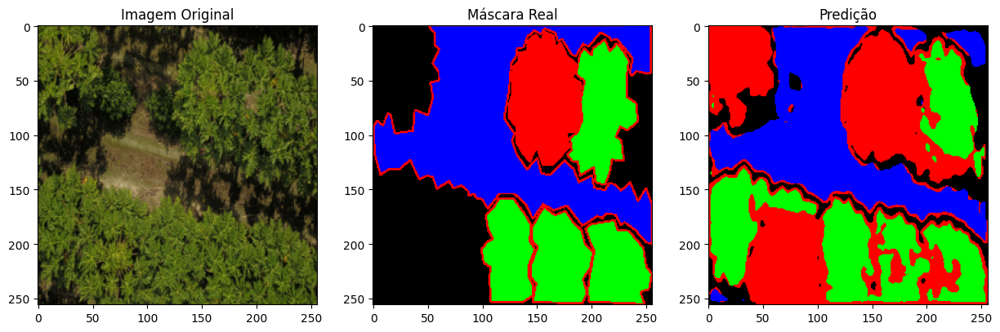

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


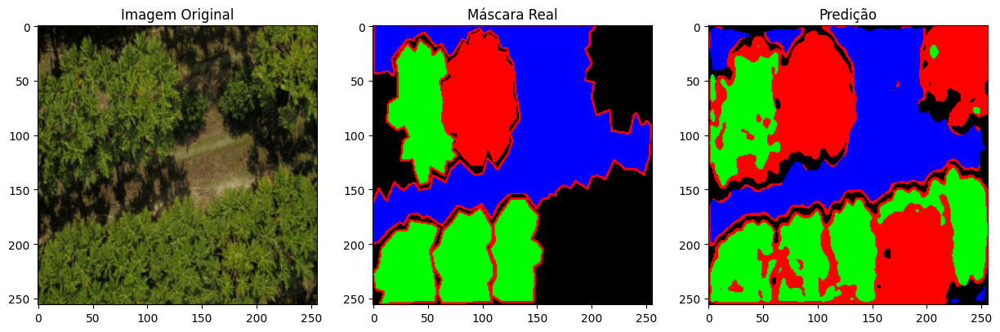

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


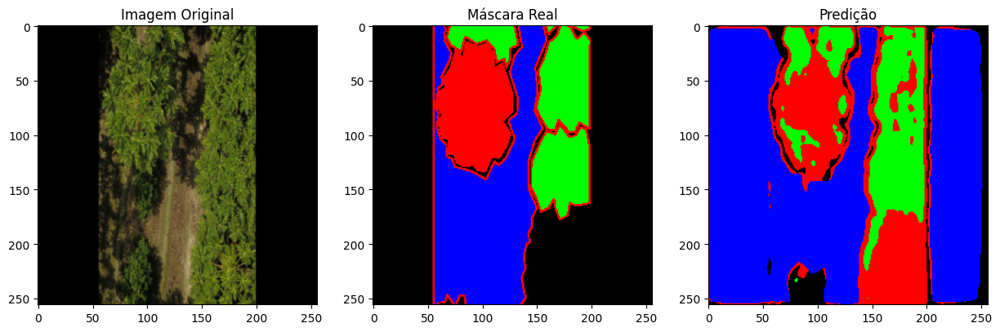

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


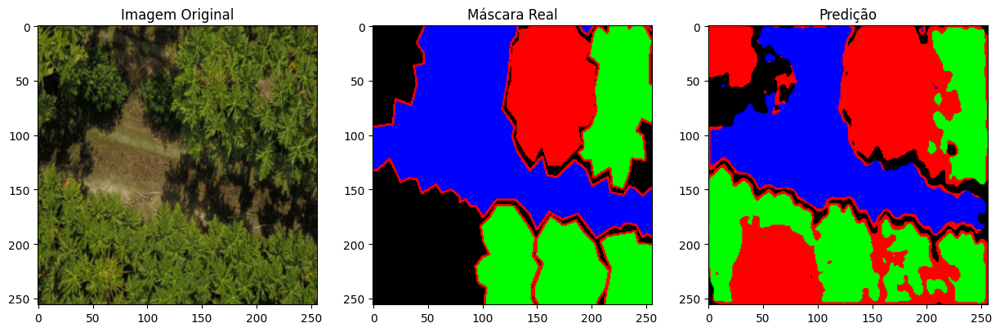

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


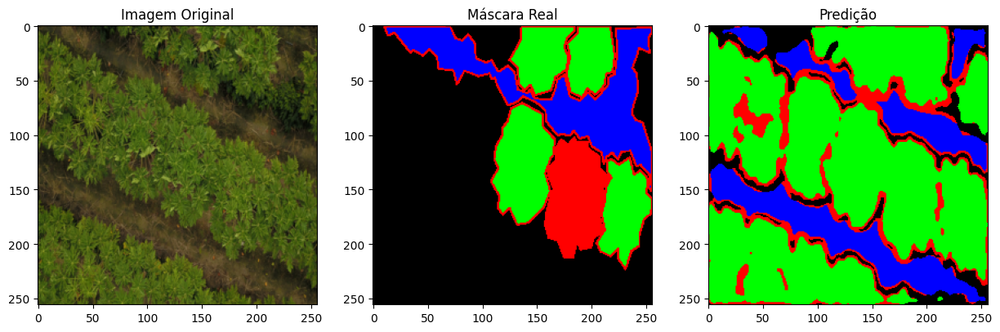

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


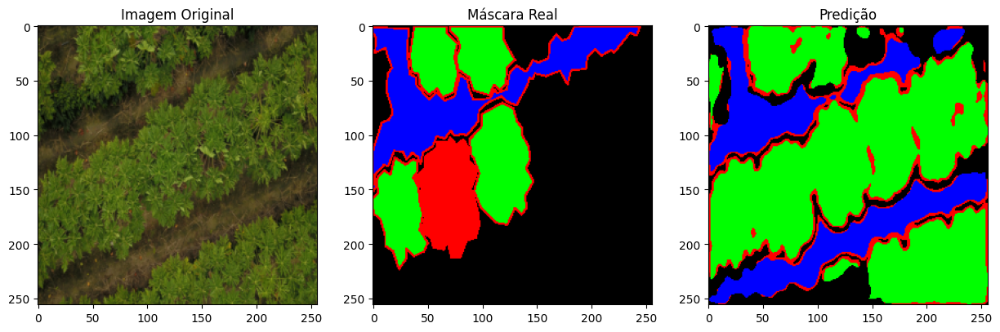

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


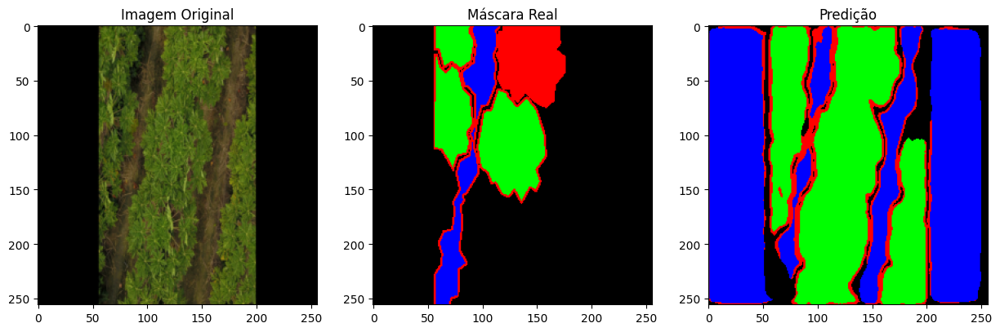

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


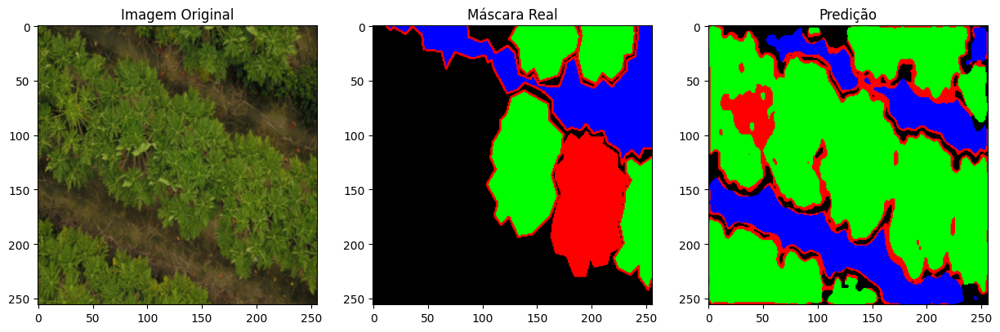

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


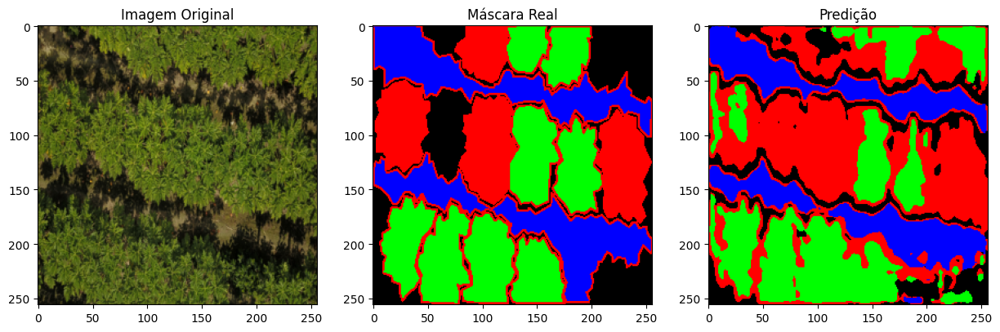

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


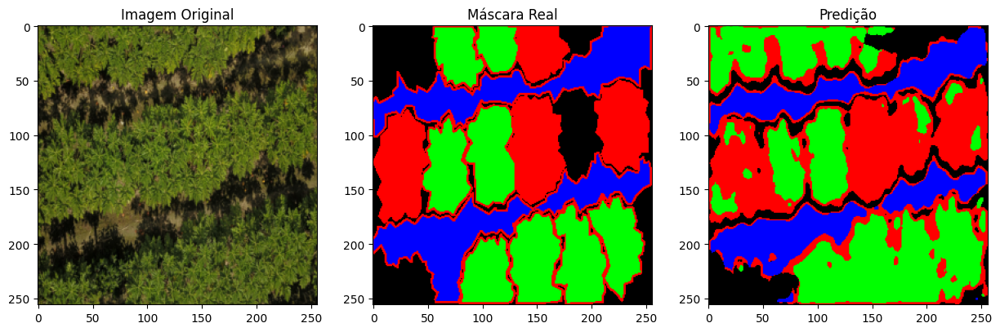

Visualizando e salvando predições para PSPNet...
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


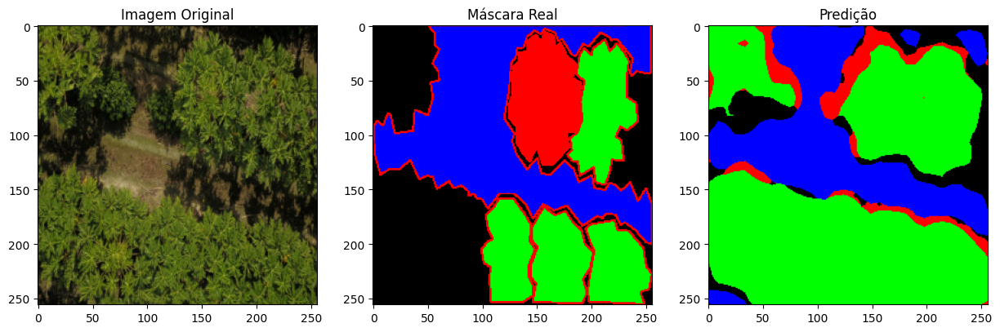

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


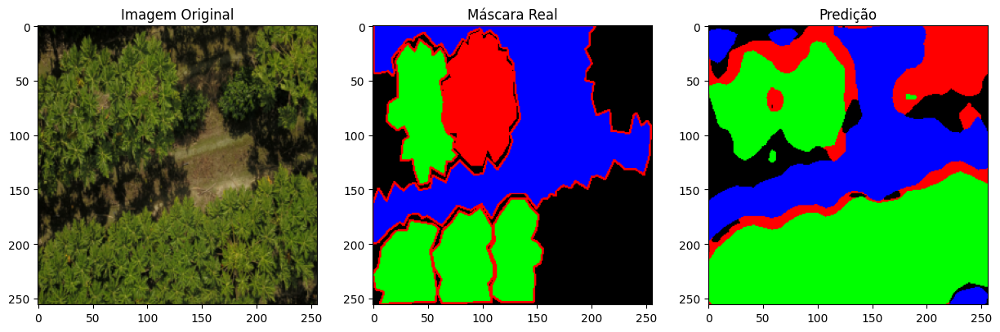

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


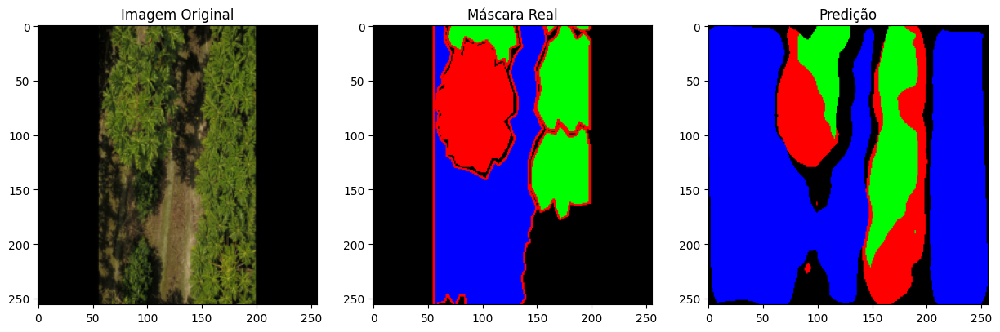

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


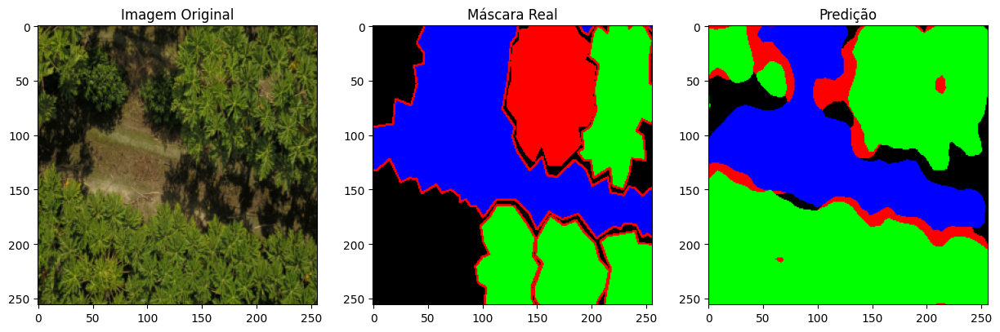

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


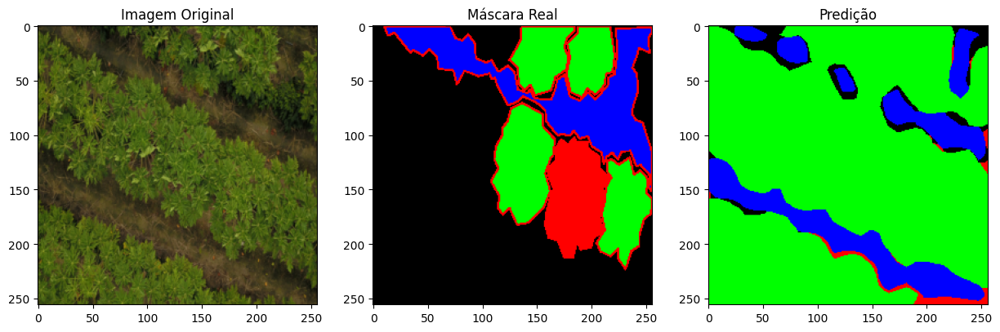

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


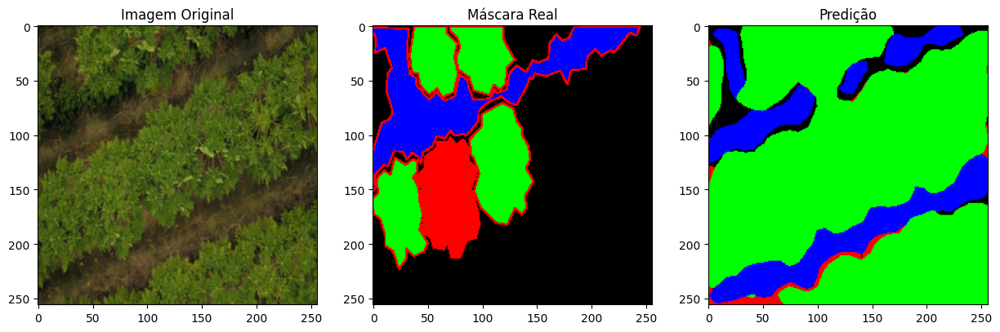

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


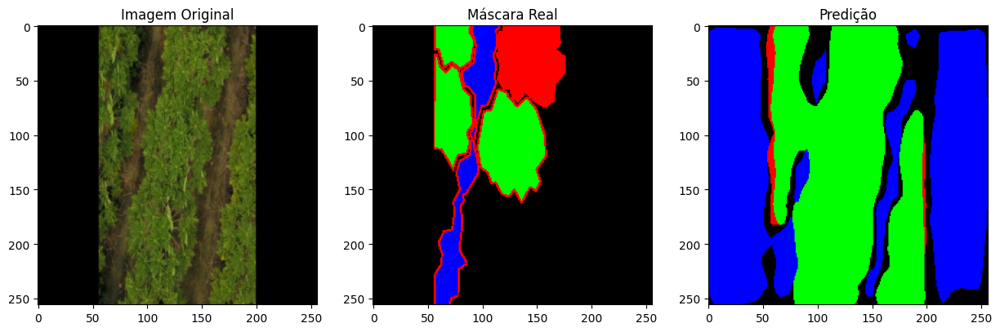

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


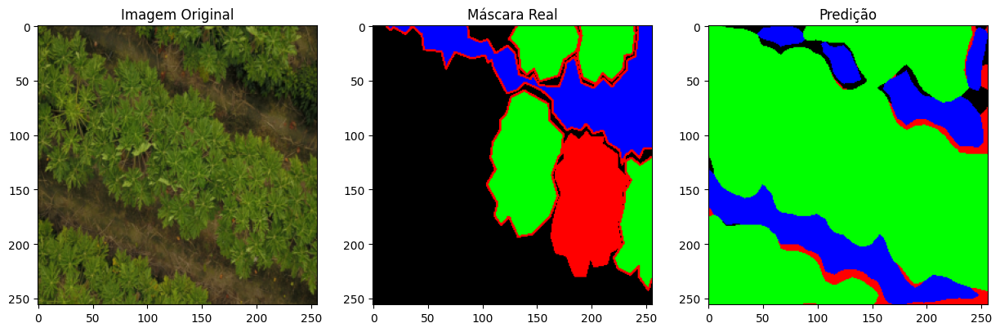

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


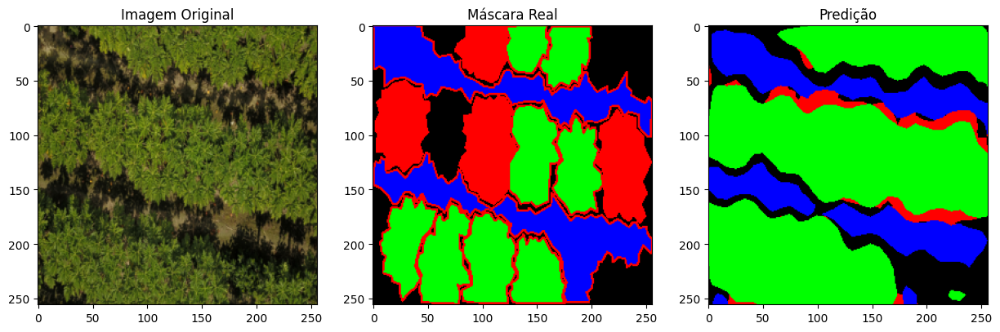

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


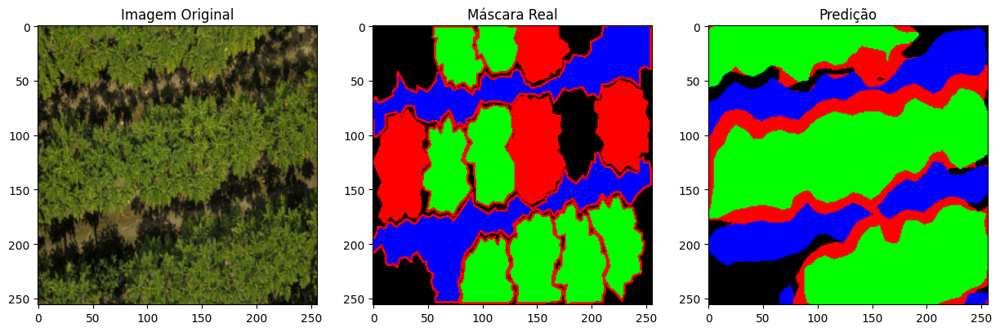

Visualizando e salvando predições para LinkNet...
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


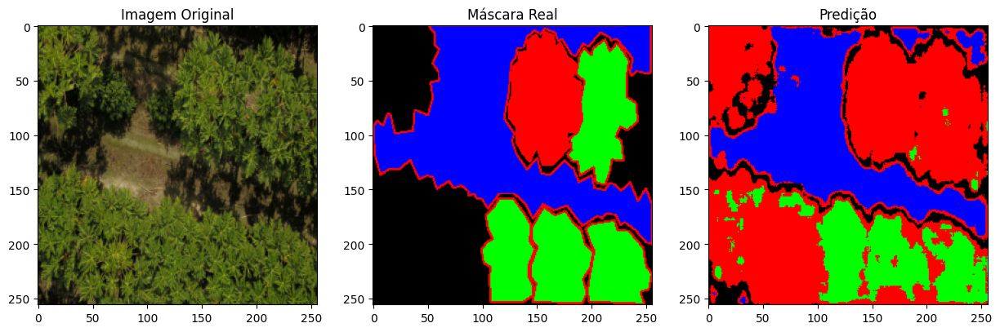

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


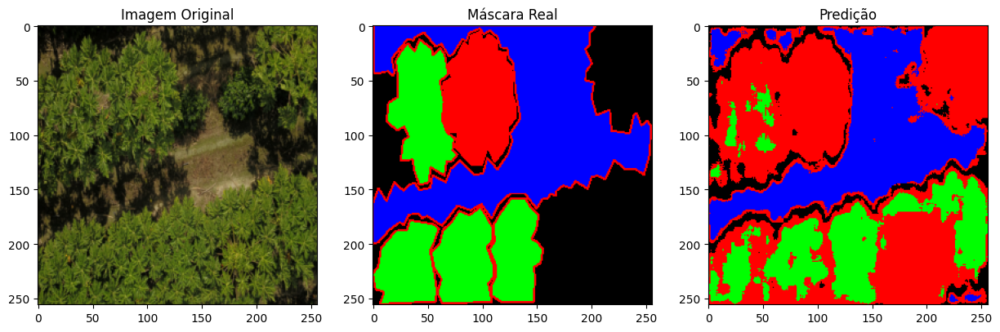

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


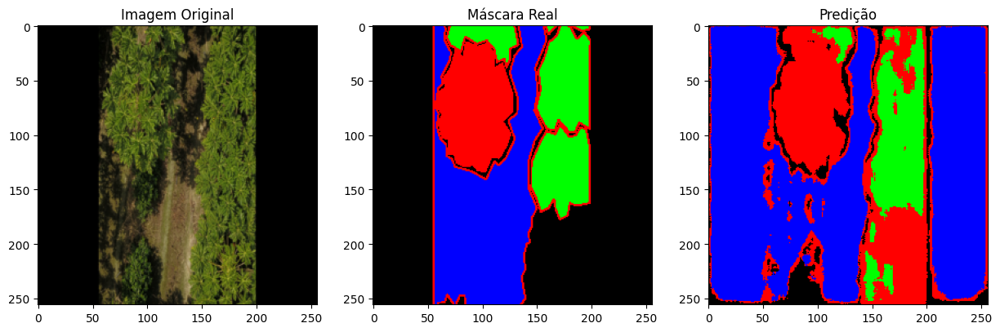

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


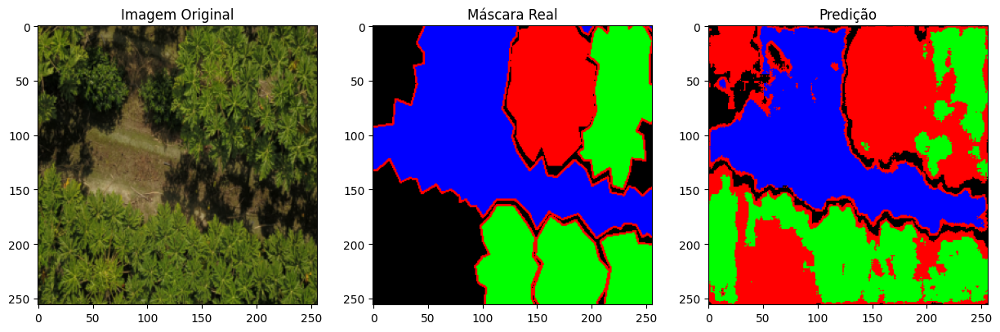

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


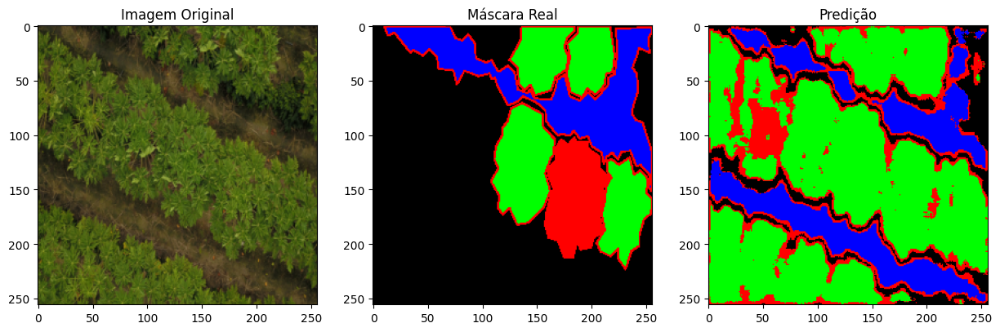

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


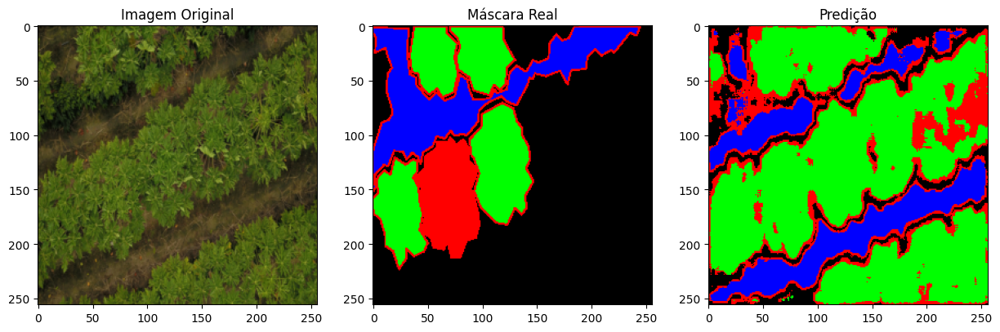

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


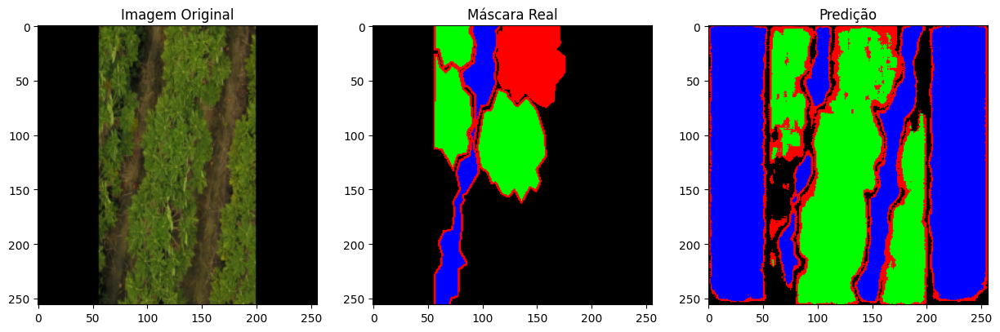

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


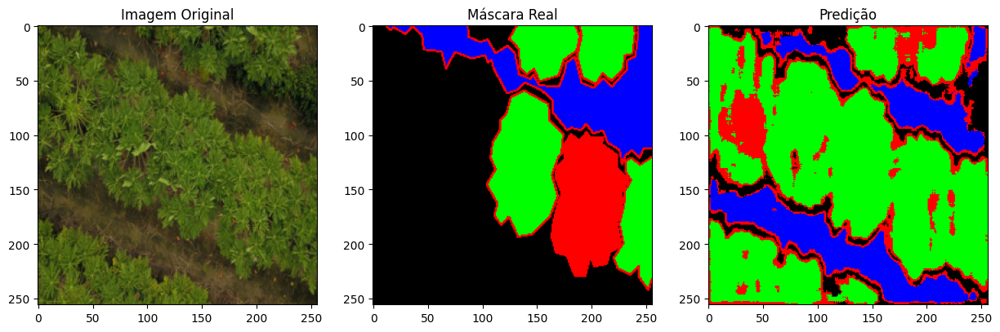

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


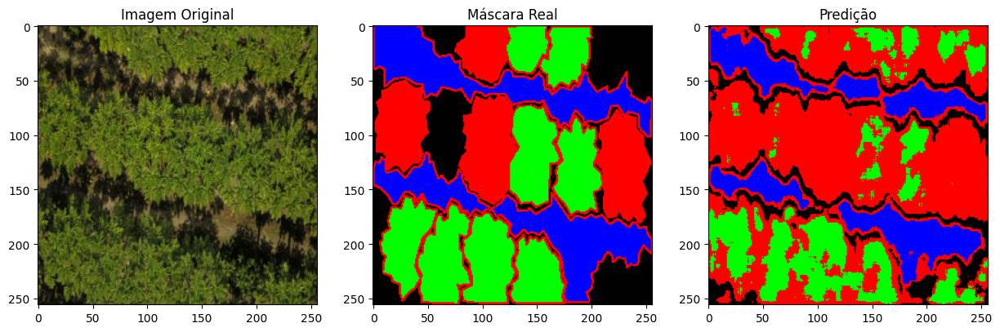

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


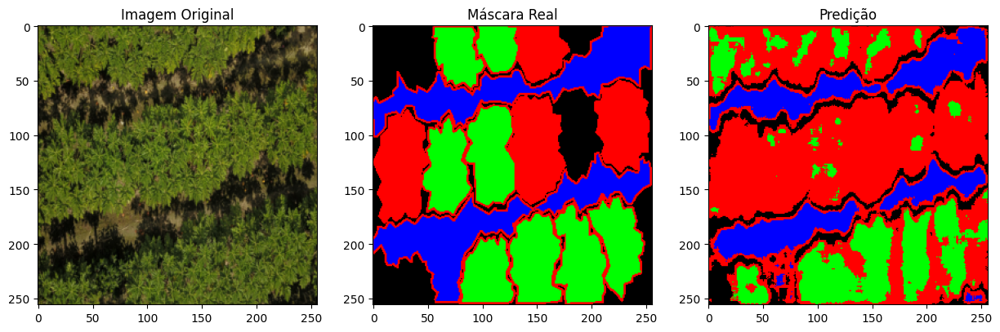

Visualização e salvamento concluídos!


In [8]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

# Diretório para salvar os resultados das imagens
results_dir = "E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/results/images"
os.makedirs(results_dir, exist_ok=True)

# Diretório onde os arquivos do modelo foram salvados
model_dir = "E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/results/data" 

# Função auxiliar para transformar índices de classe em cores RGB
def class_to_rgb(mask_indices):
    mask_rgb = np.zeros((mask_indices.shape[0], mask_indices.shape[1], 3), dtype=np.uint8)
    unique_classes = np.unique(mask_indices)
    print(f"Unique classes in mask: {unique_classes}")  # Log para classes únicas

    for class_index, color in enumerate(CLASS_COLORS.values()):
        mask_rgb[mask_indices == class_index] = color
        print(f"Mapping class {class_index} to color {color}")  # Log para mapeamento
    return mask_rgb

# Função para visualizar e salvar predições
def visualize_and_save_predictions(model, data_loader, device, results_dir, model_name, num_images=5):
    model.eval()
    images_saved = 0

    with torch.no_grad():
        for inputs, masks in data_loader:
            inputs, masks = inputs.to(device), masks.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for i in range(inputs.size(0)):
                images_saved += 1
                if images_saved > num_images:
                    return
                
                # Processamento para visualização
                image = (inputs[i].cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)
                
                # Conversão de índices para RGB
                mask = class_to_rgb(masks[i].cpu().numpy())
                prediction = class_to_rgb(preds[i].cpu().numpy())

                # Logs para depuração
                print(f"Input shape: {inputs[i].shape}")
                print(f"Mask shape: {masks[i].shape}")
                print(f"Prediction shape: {preds[i].shape}")

                # Visualização
                plt.figure(figsize=(15, 5))
                
                plt.subplot(1, 3, 1)
                plt.imshow(image)
                plt.title('Imagem Original')

                plt.subplot(1, 3, 2)
                plt.imshow(mask)
                plt.title('Máscara Real')

                plt.subplot(1, 3, 3)
                plt.imshow(prediction)
                plt.title('Predição')

                plt.show()
                
                # Salvar as imagens
                plt.imsave(os.path.join(results_dir, f'{model_name}_input_{images_saved}.png'), image)
                plt.imsave(os.path.join(results_dir, f'{model_name}_mask_{images_saved}.png'), mask)
                plt.imsave(os.path.join(results_dir, f'{model_name}_prediction_{images_saved}.png'), prediction)

# Executar para cada modelo
for model_name, model in models.items():
    print(f"Visualizando e salvando predições para {model_name}...")
    
    trained_model = model
    trained_model_path = os.path.join(model_dir, f'{model_name}_best.pth')
    trained_model.load_state_dict(torch.load(trained_model_path))
    trained_model.to(device)
    
    visualize_and_save_predictions(trained_model, test_loader, device, results_dir, model_name, num_images=10)

print("Visualização e salvamento concluídos!")